In [165]:
# Import all the libraries that we shall be using
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd 
import plotly.express as px 
import numpy as np 
from matplotlib import pyplot as plt 
import seaborn as sns
from sklearn.metrics import roc_curve
from sklearn.metrics import log_loss, roc_auc_score, recall_score, precision_score, average_precision_score, f1_score, classification_report, accuracy_score, plot_roc_curve,plot_precision_recall_curve,plot_confusion_matrix


In [166]:
y=pd.read_csv('actual.csv')
print(y.shape)
y.head()
y['cancer'].value_counts()
'covert the label to binary 0 and 1'
y = y.replace({'ALL':0,'AML':1})
labels = ['ALL', 'AML'] # for plotting convenience later on

(72, 2)


In [167]:
y
y['cancer'].value_counts()

0    47
1    25
Name: cancer, dtype: int64

In [168]:
train=pd.read_csv('data_set_ALL_AML_train.csv')
test=pd.read_csv('data_set_ALL_AML_independent.csv')
print(train.shape)
print(test.shape)
train.head()

(7129, 78)
(7129, 70)


,Gene Description,Gene Accession Number,1,call,2,call.1,3,call.2,4,call.3,...,29,call.33,30,call.34,31,call.35,32,call.36,33,call.37
0,AFFX-BioB-5_at (endogenous control),AFFX-BioB-5_at,-214,A,-139,A,-76,A,-135,A,...,15,A,-318,A,-32,A,-124,A,-135,A
1,AFFX-BioB-M_at (endogenous control),AFFX-BioB-M_at,-153,A,-73,A,-49,A,-114,A,...,-114,A,-192,A,-49,A,-79,A,-186,A
2,AFFX-BioB-3_at (endogenous control),AFFX-BioB-3_at,-58,A,-1,A,-307,A,265,A,...,2,A,-95,A,49,A,-37,A,-70,A
3,AFFX-BioC-5_at (endogenous control),AFFX-BioC-5_at,88,A,283,A,309,A,12,A,...,193,A,312,A,230,P,330,A,337,A
4,AFFX-BioC-3_at (endogenous control),AFFX-BioC-3_at,-295,A,-264,A,-376,A,-419,A,...,-51,A,-139,A,-367,A,-188,A,-407,A


In [169]:
# Remove "call" columns from training and testing data
train_to_keep = [col for col in train.columns if "call" not in col]
test_to_keep = [col for col in test.columns if "call" not in col]
print(len(train_to_keep))
print(len(test_to_keep))

40
36


In [170]:
train_k = train[train_to_keep]
test_k = test[test_to_keep]

In [171]:
'''give the correct name to each of the columns'''
train_columns = ['Gene Description', 'Gene Accession Number', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10',
       '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', 
       '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38']

train_k = train_k.reindex(columns=train_columns)
test_columns = ['Gene Description', 'Gene Accession Number','39', '40', '41', '42', '43', '44', '45', '46',
       '47', '48', '49', '50', '51', '52', '53',  '54', '55', '56', '57', '58', '59',
       '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72']

test_k = test_k.reindex(columns=test_columns)

In [172]:
train2 = train_k.T
test2 = test_k.T

print(train2.shape) 
train2.head()

(40, 7129)


,0,1,2,3,4,5,6,7,8,9,...,7119,7120,7121,7122,7123,7124,7125,7126,7127,7128
Gene Description,AFFX-BioB-5_at (endogenous control),AFFX-BioB-M_at (endogenous control),AFFX-BioB-3_at (endogenous control),AFFX-BioC-5_at (endogenous control),AFFX-BioC-3_at (endogenous control),AFFX-BioDn-5_at (endogenous control),AFFX-BioDn-3_at (endogenous control),AFFX-CreX-5_at (endogenous control),AFFX-CreX-3_at (endogenous control),AFFX-BioB-5_st (endogenous control),...,Transcription factor Stat5b (stat5b) mRNA,Breast epithelial antigen BA46 mRNA,GB DEF = Calcium/calmodulin-dependent protein ...,TUBULIN ALPHA-4 CHAIN,CYP4B1 Cytochrome P450; subfamily IVB; polypep...,PTGER3 Prostaglandin E receptor 3 (subtype EP3...,HMG2 High-mobility group (nonhistone chromosom...,RB1 Retinoblastoma 1 (including osteosarcoma),GB DEF = Glycophorin Sta (type A) exons 3 and ...,GB DEF = mRNA (clone 1A7)
Gene Accession Number,AFFX-BioB-5_at,AFFX-BioB-M_at,AFFX-BioB-3_at,AFFX-BioC-5_at,AFFX-BioC-3_at,AFFX-BioDn-5_at,AFFX-BioDn-3_at,AFFX-CreX-5_at,AFFX-CreX-3_at,AFFX-BioB-5_st,...,U48730_at,U58516_at,U73738_at,X06956_at,X16699_at,X83863_at,Z17240_at,L49218_f_at,M71243_f_at,Z78285_f_at
1,-214,-153,-58,88,-295,-558,199,-176,252,206,...,185,511,-125,389,-37,793,329,36,191,-37
2,-139,-73,-1,283,-264,-400,-330,-168,101,74,...,169,837,-36,442,-17,782,295,11,76,-14
3,-76,-49,-307,309,-376,-650,33,-367,206,-215,...,315,1199,33,168,52,1138,777,41,228,-41


In [173]:
# Clean up the column names for training and testing data
train2.columns = train2.iloc[1]
test2.columns=test2.iloc[1]
train2 = train2.iloc[2: , :]
test2=test2.iloc[2:,:]

In [174]:
print(train2.shape)
print(test2.shape)
train2.head()

train2.to_csv('trian.csv')


(38, 7129)
(34, 7129)


In [175]:
train2 = train2.reset_index(drop=True)#reorder the index so it matches with the y
ytrain = y['cancer'][0:38].reset_index(drop=True)

# Subset the rest for testing
test2 = test2.reset_index(drop=True)
ytest = y['cancer'][38:].reset_index(drop=True)
ytrain.to_csv('ytrian.csv')

In [ ]:
train2.describe()

Gene Accession Number,AFFX-BioB-5_at,AFFX-BioB-M_at,AFFX-BioB-3_at,AFFX-BioC-5_at,AFFX-BioC-3_at,AFFX-BioDn-5_at,AFFX-BioDn-3_at,AFFX-CreX-5_at,AFFX-CreX-3_at,AFFX-BioB-5_st,...,U48730_at,U58516_at,U73738_at,X06956_at,X16699_at,X83863_at,Z17240_at,L49218_f_at,M71243_f_at,Z78285_f_at
count,38,38,38,38,38,38,38,38,38,38,...,38,38,38,38,38,38,38,38,38,38
unique,35,35,35,37,38,36,37,38,34,36,...,33,38,36,38,36,38,37,31,36,36
top,-81,-150,-1,132,-295,-558,-31,-176,34,350,...,185,511,57,389,-22,793,295,9,116,-41
freq,2,2,2,2,1,2,2,1,2,2,...,2,1,3,1,2,1,2,2,2,2


In [ ]:
test2.describe()

Gene Accession Number,AFFX-BioB-5_at,AFFX-BioB-M_at,AFFX-BioB-3_at,AFFX-BioC-5_at,AFFX-BioC-3_at,AFFX-BioDn-5_at,AFFX-BioDn-3_at,AFFX-CreX-5_at,AFFX-CreX-3_at,AFFX-BioB-5_st,...,U48730_at,U58516_at,U73738_at,X06956_at,X16699_at,X83863_at,Z17240_at,L49218_f_at,M71243_f_at,Z78285_f_at
count,34,34,34,34,34,34,34,34,34,34,...,34,34,34,34,34,34,34,34,34,34
unique,33,33,32,32,33,33,33,31,29,33,...,32,33,32,31,30,34,32,28,34,30
top,-62,-118,12,142,-201,-493,-222,-141,-6,157,...,214,690,-34,241,18,1074,174,0,168,-12
freq,2,2,2,2,2,2,2,2,3,2,...,2,2,2,2,2,1,2,5,1,2


In [ ]:
print(train2.columns)

Index(['AFFX-BioB-5_at', 'AFFX-BioB-M_at', 'AFFX-BioB-3_at', 'AFFX-BioC-5_at',
       'AFFX-BioC-3_at', 'AFFX-BioDn-5_at', 'AFFX-BioDn-3_at',
       'AFFX-CreX-5_at', 'AFFX-CreX-3_at', 'AFFX-BioB-5_st',
       ...
       'U48730_at', 'U58516_at', 'U73738_at', 'X06956_at', 'X16699_at',
       'X83863_at', 'Z17240_at', 'L49218_f_at', 'M71243_f_at', 'Z78285_f_at'],
      dtype='object', name='Gene Accession Number', length=7129)


In [176]:

from sklearn import preprocessing
# Convert from integer to float
train3 = train2.astype(float, 64)
test3 = test2.astype(float, 64)
scaler = preprocessing.StandardScaler()
# Apply the same scaling to both datasets
train_standardized = scaler.fit_transform(train3)
test_standardized = scaler.transform(test3)

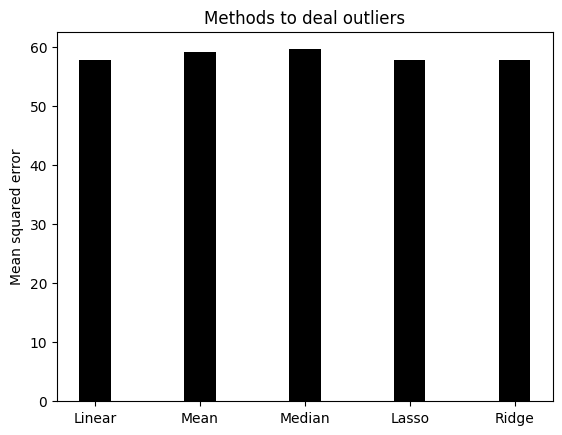

In [373]:
labels=["Linear","Mean","Median","Lasso","Ridge"]
xx=[i for i in range(1,6)]
width = [0.3,0.3,0.3,0.3,0.3]
plt.bar(xx,[57.83352,59.11386,59.60493,57.83674,57.83352],width=width,align='center',color='black')
plt.xticks(xx,labels)
plt.ylabel('Mean squared error')
plt.title('Methods to deal outliers')
plt.show()

In [ ]:
train_standardized

array([[-0.86149567, -0.03310102, -0.3517011 , ...,  0.54606799,
        -0.43582025, -0.25587506],
       [-0.16772267,  1.03740009,  0.13913948, ..., -0.26704265,
        -0.59574421,  0.49964792],
       [ 0.41504666,  1.35855042, -2.49589941, ...,  0.70869012,
        -0.38436645, -0.38727036],
       ...,
       [-0.85224537, -1.35784615,  1.31887912, ...,  0.22082373,
        -0.35933487,  1.71505444],
       [ 0.8868123 ,  1.74660708,  1.21554426, ..., -0.23451823,
         3.73889051, -0.12447976],
       [ 0.45204788,  0.15423667,  0.13913948, ...,  0.0582016 ,
         2.80298767,  0.95953146]])

In [ ]:
test_standardized
pd.DataFrame(train_standardized).describe()

,0,1,2,3,4,5,6,7,8,9,...,7119,7120,7121,7122,7123,7124,7125,7126,7127,7128
count,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,...,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,3.800000e+01,38.000000,3.800000e+01
mean,-5.258951e-17,-1.913674e-16,1.387779e-17,4.674623e-17,-2.498002e-16,2.629476e-17,-4.090295e-17,-1.123918e-16,-4.090295e-17,-7.011935e-17,...,-1.022574e-16,-9.933574e-17,-2.921640e-17,-2.702517e-17,3.505967e-17,-8.180591e-17,-1.110223e-16,1.807764e-17,0.000000,-2.045148e-17
std,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,...,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423e+00,1.013423,1.013423e+00
min,-3.285076e+00,-2.361441e+00,-2.495899e+00,-1.875514e+00,-2.414292e+00,-2.624409e+00,-2.010484e+00,-2.920885e+00,-2.205897e+00,-1.565148e+00,...,-1.777269e+00,-1.791608e+00,-2.455287e+00,-7.836921e-01,-2.200481e+00,-1.416145e+00,-1.424031e+00,-2.251033e+00,-0.704214,-2.128258e+00
25%,-1.654101e-01,-7.289267e-01,-5.691349e-01,-8.639716e-01,-8.919356e-01,-8.064200e-01,-5.791108e-01,-4.246719e-01,-7.682165e-01,-7.613588e-01,...,-7.020416e-01,-5.962778e-01,-6.777200e-01,-4.847885e-01,-6.688352e-01,-5.752431e-01,-4.979153e-01,-3.646159e-01,-0.512306,-4.447558e-01
50%,1.329123e-01,1.207835e-01,-2.268381e-01,1.605119e-01,1.237298e-01,9.509299e-02,4.653786e-02,1.749771e-01,5.450618e-03,-1.991847e-01,...,-5.093181e-02,-1.728964e-01,2.213528e-02,-2.873178e-01,4.912349e-02,-2.616777e-01,-1.320572e-01,2.567718e-02,-0.362811,1.054620e-01
75%,4.867365e-01,7.463576e-01,5.546317e-01,8.442198e-01,8.016008e-01,7.067004e-01,5.659879e-01,6.295948e-01,6.481426e-01,6.249387e-01,...,6.330321e-01,7.435798e-01,6.332765e-01,1.135584e-01,7.012693e-01,5.104181e-01,2.591574e-01,3.590525e-01,-0.023842,5.817700e-01
max,1.275325e+00,1.746607e+00,2.429729e+00,1.816940e+00,2.059200e+00,2.126303e+00,2.135881e+00,1.976713e+00,2.241166e+00,2.147593e+00,...,2.117443e+00,3.067927e+00,2.749271e+00,4.592258e+00,1.724361e+00,3.037850e+00,3.734206e+00,3.115498e+00,3.738891,2.142089e+00


In [163]:
from numpy.linalg import eig

w2,v2=eig(np.dot(np.transpose(train_standardized),train_standardized))
print('E-value:', w2)
print('E-vector', v2)

KeyboardInterrupt: 

In [ ]:
print(len(w))
print(max(w))
print(min(w))
print(max(w)/min(w))
data={'eigenvalue':w}
eigen=pd.DataFrame(data)
eigen.describe()


7129
(1526821846743.4766+0j)
(-3.28081447913436e-05-7.67704018073907e-06j)
(-4.412198817315696e+16+1.0324456875379084e+16j)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/numpy/core/_methods.py:48: ComplexWarning: Casting complex values to real discards the imaginary part
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


,eigenvalue
count,7.129000e+03+0.000000e+00j
mean,2.391413e+08+1.436920e-24j
std,1.809229e+10+0.000000e+00j
min,-3.280814e-05-7.677040e-06j
25%,-1.578434e-08+3.075937e-09j
50%,2.787262e-12+1.074572e-10j
75%,1.710216e-08-5.191922e-08j
max,1.526822e+12+0.000000e+00j


In [ ]:
data2={'eigenvalue':w2}
eigen2=pd.DataFrame(data2)
con=[]
for i in range(len(w2)):
    con.append(max(w2)/w2[i])
print(max(w2))
print(min(abs(np.array(w2))))
print(max(w2)/min(abs(np.array(w2))))
eigen2.describe()


(40602.23086609274+0j)
1.4147959793679315e-15
(2.869829392944135e+19+0j)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/numpy/core/_methods.py:48: ComplexWarning: Casting complex values to real discards the imaginary part
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


,eigenvalue
count,7.129000e+03+0.000000e+00j
mean,3.800000e+01+1.982941e-31j
std,7.695836e+02+0.000000e+00j
min,-4.781990e-12+0.000000e+00j
25%,-1.204417e-13+2.224785e-14j
50%,1.585854e-15+5.426017e-14j
75%,1.233693e-13-7.059765e-14j
max,4.060223e+04+0.000000e+00j


In [ ]:
def minimum(a, n):
  
    # inbuilt function to find the position of minimum 
    minpos = a.index(min(a))
      
    # inbuilt function to find the position of maximum 
    maxpos = a.index(max(a)) 
      
    # printing the position 
    print ("The maximum is at position", maxpos + 1)
    print ("The minimum is at position", minpos + 1)
      
      
# driver code
a = [3, 4, 1, 3, 4, 5] 
minimum(list(abs(np.array(w2))), len(list(abs(np.array(w2)))))
print(w2[0])
print(w2[7127])
print(np.array(v2)[7128,])

The maximum is at position 1
The minimum is at position 7128
(40602.23086609274+0j)
(-1.3980669629180446e-15+2.1692494193333218e-16j)
[ 5.95097737e-05+0.j         -4.76305008e-03+0.j
 -7.56848583e-03+0.j         ...  1.56860645e-02+0.j
 -1.51373875e-02+0.00024131j -1.51373875e-02-0.00024131j]


In [ ]:
from scipy.linalg import svd
U, s, VT = svd(train3)
U2, s2, VT2 = svd(train_standardized)

np.shape(s)

(38,)

In [ ]:

correlations=train3.corr()
correlations=pd.DataFrame(data=correlations)
print(correlations)


Gene Accession Number  AFFX-BioB-5_at  AFFX-BioB-M_at  AFFX-BioB-3_at  \
Gene Accession Number                                                   
AFFX-BioB-5_at               1.000000        0.404485        0.125840   
AFFX-BioB-M_at               0.404485        1.000000        0.111541   
AFFX-BioB-3_at               0.125840        0.111541        1.000000   
AFFX-BioC-5_at               0.106268        0.211543       -0.132363   
AFFX-BioC-3_at               0.292728        0.213577       -0.123053   
...                               ...             ...             ...   
X83863_at                   -0.280454       -0.134782        0.096754   
Z17240_at                   -0.445383       -0.269702       -0.122109   
L49218_f_at                 -0.122253       -0.204126       -0.168626   
M71243_f_at                  0.234475        0.204805        0.131645   
Z78285_f_at                 -0.055214       -0.243125       -0.079161   

Gene Accession Number  AFFX-BioC-5_at  AFFX-BioC-3

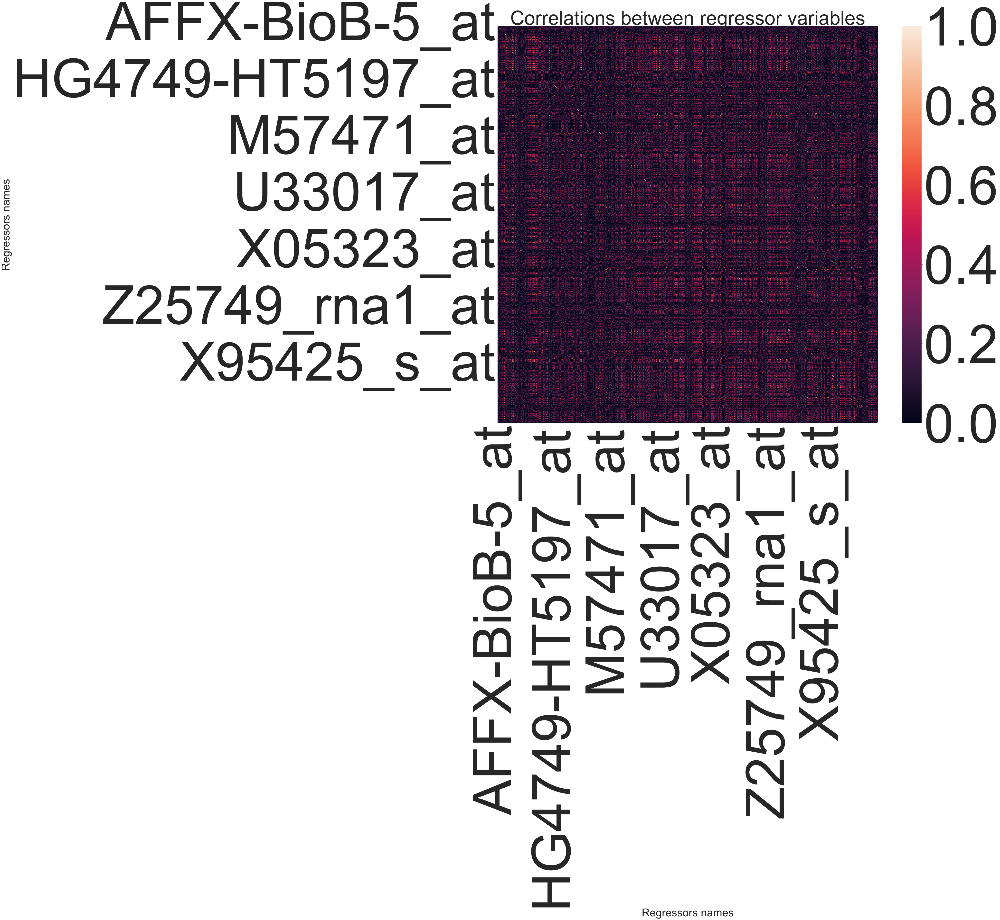

In [ ]:
fig,ax=plt.subplots(figsize=(35,30))#figure and axes object(s) with size (10,10)
ax = sns.heatmap(correlations, vmin=0, vmax=1)
plt.title('Correlations between regressor variables',fontsize=80)
plt.xlabel('Regressors names',fontsize=45)
plt.ylabel('Regressors names',fontsize=45)
sns.set(font_scale=2) # font size 2
plt.savefig('seaborn_change_colormap_size_01.png')            
plt.show()

In [ ]:
print(correlations)

Gene Accession Number  AFFX-BioB-5_at  AFFX-BioB-M_at  AFFX-BioB-3_at  \
Gene Accession Number                                                   
AFFX-BioB-5_at               1.000000        0.404485        0.125840   
AFFX-BioB-M_at               0.404485        1.000000        0.111541   
AFFX-BioB-3_at               0.125840        0.111541        1.000000   
AFFX-BioC-5_at               0.106268        0.211543       -0.132363   
AFFX-BioC-3_at               0.292728        0.213577       -0.123053   
...                               ...             ...             ...   
X83863_at                   -0.280454       -0.134782        0.096754   
Z17240_at                   -0.445383       -0.269702       -0.122109   
L49218_f_at                 -0.122253       -0.204126       -0.168626   
M71243_f_at                  0.234475        0.204805        0.131645   
Z78285_f_at                 -0.055214       -0.243125       -0.079161   

Gene Accession Number  AFFX-BioC-5_at  AFFX-BioC-3

In [335]:


pca_gender = PCA(n_components=2)
principalComponents_gender = pca_gender.fit_transform(train_standardized)
principalComponents_gender.shape

principal_gender_Df = pd.DataFrame(data=principalComponents_gender, columns=['principal component 1','principal component 2'])

principal_gender_Df.iloc[0,:]
print(list(ytrain))


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


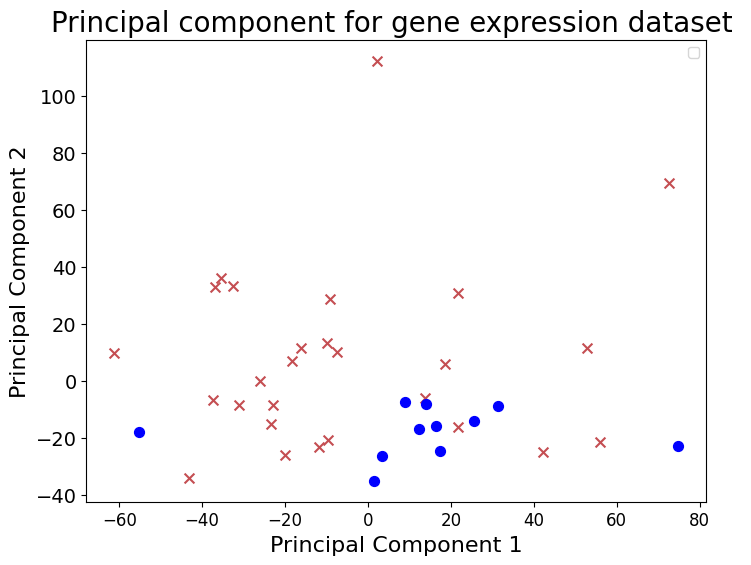

In [348]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import matplotlib as mpl
import matplotlib.pyplot as plt
inline_rc = dict(mpl.rcParams)
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot()
targets = [1, 0]
colors = ['r', 'blue']
plt.xticks(fontsize=12)
plt.yticks(fontsize=14)
plt.title('Principal component for gene expression dataset ',fontsize=20)
ax.set_xlabel('Principal Component 1',fontsize=16)
ax.set_ylabel('Principal Component 2',fontsize=16)
y=list(ytrain)
for i in range (len(y)):
    if y[i]==0:
        ax.scatter(principal_gender_Df.iloc[i,0],principal_gender_Df.iloc[i,1] ,marker='x', c='r', s=50)
        
    else:
        ax.scatter(principal_gender_Df.iloc[i,0],principal_gender_Df.iloc[i,1] ,marker='o', c='blue', s=50
                   )
    

plt.legend()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


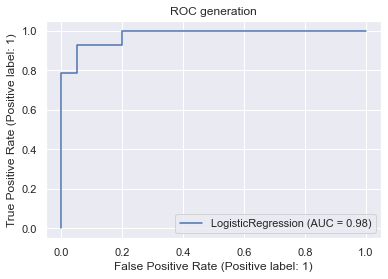

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


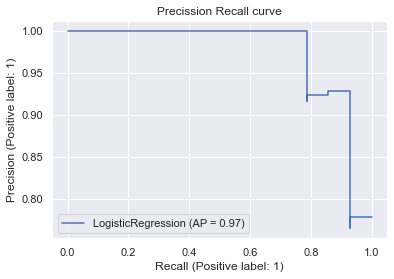

Log loss = 0.34045
AUC = 0.97857
Average Precision = 0.97353

Using 0.5 as threshold:
Accuracy = 0.91176
Precision = 0.86667
Recall = 0.92857
F1 score = 0.89655

Classification Report
Confusion Matrix


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


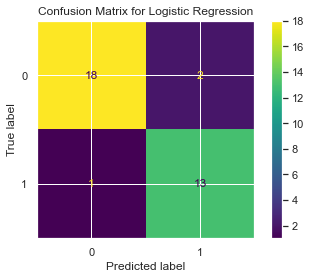

In [345]:
#Train the model 
Classification=LogisticRegression(penalty='none',fit_intercept=False)#without penalty term in the cost function 
Classification.fit(train_standardized,ytrain)

#Evaluation 
from sklearn.metrics import log_loss, roc_auc_score, recall_score, precision_score, average_precision_score, f1_score, classification_report, accuracy_score, plot_roc_curve,plot_precision_recall_curve,plot_confusion_matrix
plot_roc_curve(Classification,test_standardized,ytest)
plt.title('ROC generation')
plt.show()
plot_precision_recall_curve(Classification,test_standardized,ytest)
plt.title('Precission Recall curve')
plt.show()
TestProbability=Classification.predict_proba(test_standardized)[:,1] #probability estimates 
#The function predict_proba() returns a numpy array of two columns. 
#The first column is the probability that target=0 and the second column is the probability that target=1.
# That is why we add [:,1] after predict_proba() in order to get the probabilities of target=1.
TestPred=Classification.predict(test_standardized)
#should returns 0,1
fpr1,tpr1,thresholds=roc_curve(ytest,TestProbability)
print('Log loss = {:.5f}'.format(log_loss(ytest, TestProbability)))
print('AUC = {:.5f}'.format(roc_auc_score(ytest, TestProbability)))
print('Average Precision = {:.5f}'.format(average_precision_score(ytest, TestProbability)))
print('\nUsing 0.5 as threshold:')
print('Accuracy = {:.5f}'.format(accuracy_score(ytest, TestPred)))
print('Precision = {:.5f}'.format(precision_score(ytest,TestPred)))
print('Recall = {:.5f}'.format(recall_score(ytest, TestPred)))
print('F1 score = {:.5f}'.format(f1_score(ytest, TestPred)))
print('\nClassification Report')
print('Confusion Matrix')

plot_confusion_matrix(Classification, test_standardized, ytest)
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


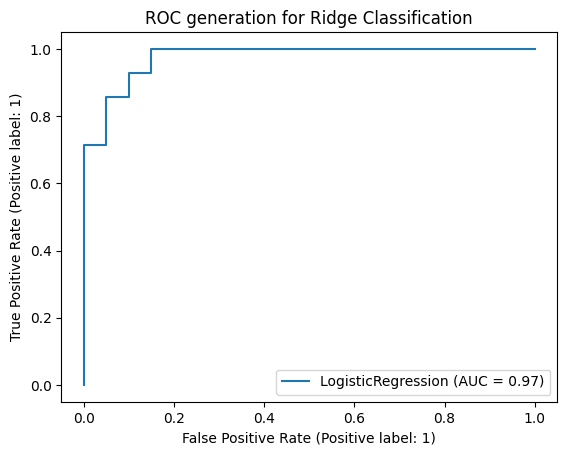

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


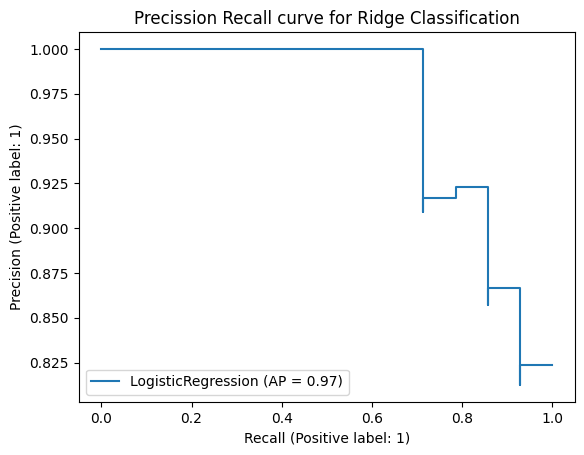

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Log loss = 0.22452
AUC = 0.97500
Average Precision = 0.96642

Using 0.5 as threshold:
Accuracy = 0.91176
Precision = 0.86667
Recall = 0.92857
F1 score = 0.89655

Ridge Classification Report
Confusion Matrix


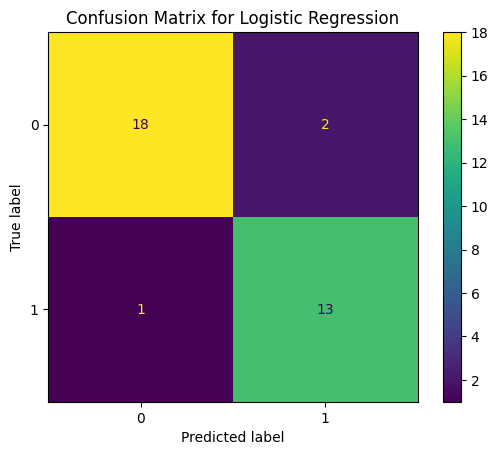

In [357]:
RidgeC=LogisticRegression(penalty='l2',C=0.1,fit_intercept=False)
RidgeC.fit(train_standardized,ytrain)
plot_roc_curve(RidgeC,test_standardized,ytest)
plt.title('ROC generation for Ridge Classification')
plt.show()
plot_precision_recall_curve(RidgeC,test_standardized,ytest)
plt.title('Precission Recall curve for Ridge Classification')
plt.show()
TestProbability2=RidgeC.predict_proba(test_standardized)[:,1] #probability estimates 
#The function predict_proba() returns a numpy array of two columns. 
#The first column is the probability that target=0 and the second column is the probability that target=1.
# That is why we add [:,1] after predict_proba() in order to get the probabilities of target=1.
TestPred2=RidgeC.predict(test_standardized)
#should returns 0,1
fpr2,tpr2,thresholds=roc_curve(ytest,TestProbability2)
print('Log loss = {:.5f}'.format(log_loss(ytest, TestProbability2)))
print('AUC = {:.5f}'.format(roc_auc_score(ytest, TestProbability2)))
print('Average Precision = {:.5f}'.format(average_precision_score(ytest, TestProbability2)))
print('\nUsing 0.5 as threshold:')
print('Accuracy = {:.5f}'.format(accuracy_score(ytest, TestPred2)))
print('Precision = {:.5f}'.format(precision_score(ytest,TestPred2)))
print('Recall = {:.5f}'.format(recall_score(ytest, TestPred2)))
print('F1 score = {:.5f}'.format(f1_score(ytest, TestPred2)))

print('\nRidge Classification Report')
print('Confusion Matrix')

plot_confusion_matrix(RidgeC, test_standardized, ytest)
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

In [ ]:
coefficients=np.hstack((RidgeC.intercept_,RidgeC.coef_[0]))
a={'ss':coefficients}
print(pd.DataFrame(a))

            ss
0     0.000000
1     0.008491
2     0.001193
3    -0.002046
4     0.011844
...        ...
7125  0.004762
7126 -0.001622
7127 -0.003722
7128  0.015166
7129  0.005173

[7130 rows x 1 columns]


In [365]:
def ffff(p):
    return(p*(p-1)+2)
count=0
for i in range(1,219):
    count=count+ffff(i)

print(count)

3453774


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


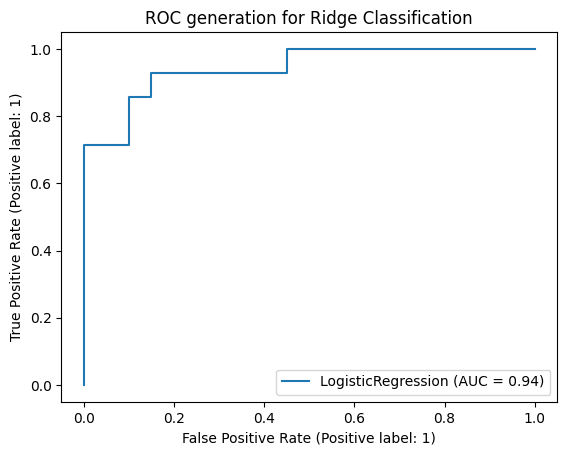

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


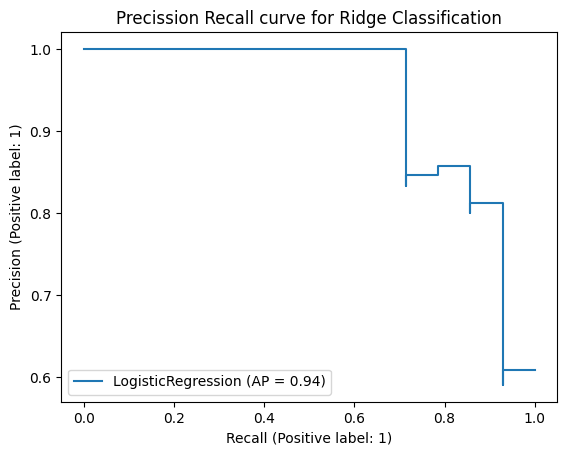

Log loss = 0.57193
AUC = 0.94286
Average Precision = 0.93746

Using 0.5 as threshold:
Accuracy = 0.88235
Precision = 1.00000
Recall = 0.71429
F1 score = 0.83333

Ridge Classification Report
Confusion Matrix


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


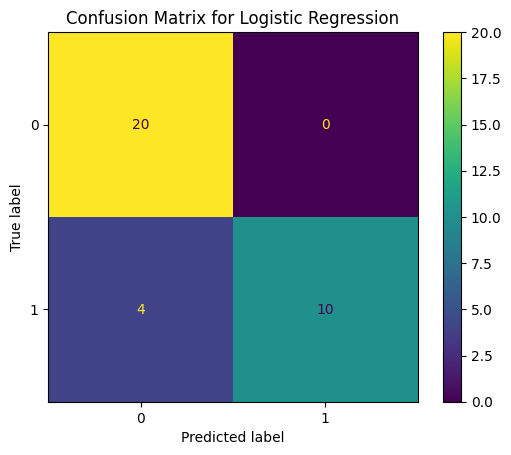

In [356]:
lassoC=LogisticRegression(penalty='l1',solver='liblinear',C=0.09,fit_intercept=False)
RidgeC=LogisticRegression(penalty='l2',C=1,fit_intercept=False)
lassoC.fit(train_standardized,ytrain)
plot_roc_curve(lassoC,test_standardized,ytest)
plt.title('ROC generation for Ridge Classification')
plt.show()
plot_precision_recall_curve(lassoC,test_standardized,ytest)
plt.title('Precission Recall curve for Ridge Classification')
plt.show()
TestProbability3=lassoC.predict_proba(test_standardized)[:,1] #probability estimates 
#The function predict_proba() returns a numpy array of two columns. 
#The first column is the probability that target=0 and the second column is the probability that target=1.
# That is why we add [:,1] after predict_proba() in order to get the probabilities of target=1.
TestPred3=lassoC.predict(test_standardized)
#should returns 0,1
fpr3,tpr3,thresholds=roc_curve(ytest,TestProbability3)
print('Log loss = {:.5f}'.format(log_loss(ytest, TestProbability3)))
print('AUC = {:.5f}'.format(roc_auc_score(ytest, TestProbability3)))
print('Average Precision = {:.5f}'.format(average_precision_score(ytest, TestProbability3)))
print('\nUsing 0.5 as threshold:')
print('Accuracy = {:.5f}'.format(accuracy_score(ytest, TestPred3)))
print('Precision = {:.5f}'.format(precision_score(ytest,TestPred3)))
print('Recall = {:.5f}'.format(recall_score(ytest, TestPred3)))
print('F1 score = {:.5f}'.format(f1_score(ytest, TestPred3)))

print('\nRidge Classification Report')
print('Confusion Matrix')

plot_confusion_matrix(lassoC, test_standardized
                      , ytest)
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


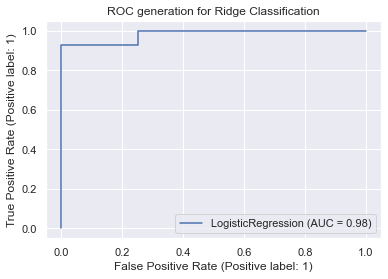

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


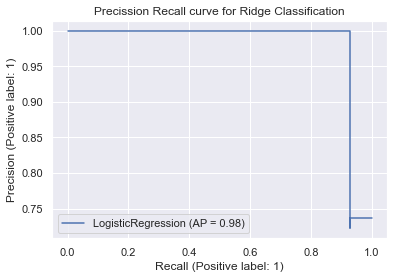

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Log loss = 0.60088
AUC = 0.98214
Average Precision = 0.98120

Using 0.5 as threshold:
Accuracy = 0.97059
Precision = 1.00000
Recall = 0.92857
F1 score = 0.96296

Ridge Classification Report
Confusion Matrix


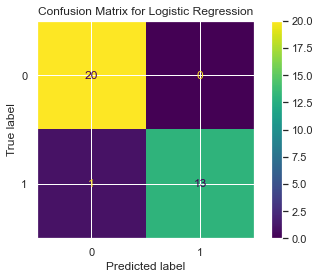

In [337]:
elastic=LogisticRegression(C=0.07, l1_ratio=0.71, solver='saga',penalty='elasticnet',fit_intercept=False)
#0.71, 'C': 0.07}
lassoC=LogisticRegression(penalty='l1',solver='liblinear',C=1,fit_intercept=False)
RidgeC=LogisticRegression(penalty='l2',C=1,fit_intercept=False)
elastic.fit(train_standardized,ytrain)
plot_roc_curve(elastic,test_standardized,ytest)
plt.title('ROC generation for Ridge Classification')
plt.show()
plot_precision_recall_curve(elastic,test_standardized,ytest)
plt.title('Precission Recall curve for Ridge Classification')
plt.show()
TestProbability3=elastic.predict_proba(test_standardized)[:,1] #probability estimates 
#The function predict_proba() returns a numpy array of two columns. 
#The first column is the probability that target=0 and the second column is the probability that target=1.
# That is why we add [:,1] after predict_proba() in order to get the probabilities of target=1.
TestPred3=elastic.predict(test_standardized)
#should returns 0,1
fpr4,tpr4,thresholds=roc_curve(ytest,TestProbability3)
print('Log loss = {:.5f}'.format(log_loss(ytest, TestProbability3)))
print('AUC = {:.5f}'.format(roc_auc_score(ytest, TestProbability3)))
print('Average Precision = {:.5f}'.format(average_precision_score(ytest, TestProbability3)))
print('\nUsing 0.5 as threshold:')
print('Accuracy = {:.5f}'.format(accuracy_score(ytest, TestPred3)))
print('Precision = {:.5f}'.format(precision_score(ytest,TestPred3)))
print('Recall = {:.5f}'.format(recall_score(ytest, TestPred3)))
print('F1 score = {:.5f}'.format(f1_score(ytest, TestPred3)))

print('\nRidge Classification Report')
print('Confusion Matrix')

plot_confusion_matrix(elastic, test_standardized
                      , ytest)
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

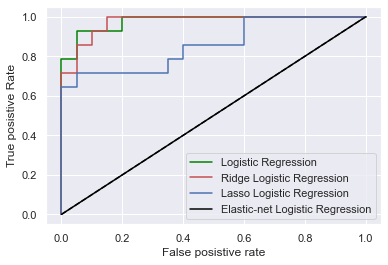

In [ ]:
sns.set(font_scale=1)
plt.plot(fpr1,tpr1,color='green',label= "Logistic Regression")
plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr2,tpr2,label='Ridge Logistic Regression',color='r')
plt.plot(fpr3,tpr3,label='Lasso Logistic Regression',color='b')
plt.plot(fpr4,tpr4,label='Elastic-net Logistic Regression',color='black')
plt.xlabel('False posistive rate')
plt.ylabel('True posistive Rate')
plt.legend()
plt.show()

In [ ]:
coefficients1=RidgeC.coef_[0]
coefficients2=elastic.coef_[0]
coefficients3=lassoC.coef_[0]
coefficients4=Classification.coef_[0]
a={'ridge':coefficients1,'elastic':coefficients2,'lasso':coefficients3,'class':coefficients4}
print(pd.DataFrame(a))
count=0
for i in range(len(coefficients3)):
    if coefficients3[i]==0:
        pass
    else:
        count=count+1
print(pd.DataFrame(a).iloc[1120])
print('number of none zero is {}'.format(count))
'1120 with 15 none zeros ' 
'0,1, with 2729 none zeros'      

AttributeError: 'LogisticRegression' object has no attribute 'coef_'

In [355]:
print('The best parameters set for grid search is: {}'.format(randomsearch.best_params_))

The best parameters set for grid search is: {'penalty': 'l2', 'C': 0.1}


In [354]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#penalty parameter choice 
penalty=[0.1*i for i in range(1,101)]
classifier=['l2']
solver=['saga']
l1_ratio=[i*0.01 for i in range(1,100)]

#create the grid
grid={'penalty':classifier,'C':penalty}
#set up algorithm

randomsearch=RandomizedSearchCV(estimator=elastic,param_distributions=grid,
                                cv=8,verbose=2,n_jobs=10,n_iter=2000,
                                scoring='accuracy',return_train_score=True)
#train 

randomsearch.fit(train_standardized,ytrain)


print('The best parameters set for random search is: {}'.format(randomsearch.best_params_))




/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_search.py:292: UserWarning: The total space of parameters 100 is smaller than n_iter=2000. Running 100 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 8 folds for each of 100 candidates, totalling 800 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..................................C=0.1, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..................................C=0.1, penalty=l2; total time=   0.2s
[CV] END ..................................C=0.1, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=0.1, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=0.1, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.2, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.1, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.1, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.2, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=0.2, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.1, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=0.2, penalty=l2; total time=   0.6s
[CV] END ..................................C=0.2, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=0.2, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.2, penalty=l2; total time=   0.6s
[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.2, penalty=l2; total time=   0.6s
[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.5s
[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.6s
[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.6s
[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.7s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.4s
[CV] END ..................C=0.30000000000000004, penalty=l2; total time=   0.6s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=0.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.8s
[CV] END ..................................C=0.4, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=0.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.5, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=0.5, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.5, penalty=l2; total time=   0.5s
[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.5s
[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.5s
[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.5, penalty=l2; total time=   0.7s
[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.6s
[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=0.6000000000000001, penalty=l2; total time=   0.6s
[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.7s
[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_rati

[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.6s
[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.7s
[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.7s
[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.6s
[CV] END ...................C=0.7000000000000001, penalty=l2; total time=   0.6s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.7s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=0.8, penalty=l2; total time=   0.7s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.7s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.6s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.7s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.6s
[CV] END ..................................C=0.8, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The ma

[CV] END ..................................C=0.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=0.9, penalty=l2; total time=   0.7s
[CV] END ..................................C=0.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=0.9, penalty=l2; total time=   0.4s
[CV] END ..................................C=0.9, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=0.9, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=0.9, penalty=l2; total time=   0.2s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.2s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=1.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.0, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=1.1, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.2s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.6s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.7s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.7s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.7s
[CV] END ..................................C=1.1, penalty=l2; total time=   0.7s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.7s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.5s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=1.3, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.6s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.3, penalty=l2; total time=   0.5s
[CV] END ...................C=1.2000000000000002, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.3s
[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.3s
[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.4s
[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.4s
[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.5s
[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.5s
[CV] END ...................C=1.4000000000000001, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.5, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.5, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=1.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.5, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=1.5, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.5s
[CV] END ..................................C=1.5, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.5, penalty=l2; total time=   0.7s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.6s
[CV] END ..................................C=1.6, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=1.6, penalty=l2; total time=   0.3s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.3s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.3s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.3s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.3s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.4s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.4s
[CV] END ...................C=1.7000000000000002, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=1.8, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.4s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.3s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.3s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.3s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=1.8, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.2s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.3s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.2s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.2s
[CV] END ...................C=1.9000000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=2.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=2.1, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.1, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.2, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.2s
[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.2s
[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.2s
[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.2s
[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=2.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.2s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ...................C=2.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.2s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.5, penalty=l2; total time=   0.5s
[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.3s
[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.4s
[CV] END ..................................C=2.7, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.4s
[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.4s
[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.4s
[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=2.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.2s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=2.9000000000000004, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.4s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.1, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=3.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=3.2, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.4s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.4s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.3000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ...................C=3.4000000000000004, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.3s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ..................................C=3.7, penalty=l2; total time=   0.4s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.8000000000000003, penalty=l2; total time=   0.3s
[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ...................C=3.9000000000000004, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=4.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.4s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.0, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.1000000000000005, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=4.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=4.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=4.2, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=4.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.2, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=4.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.4s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.4s
[CV] END ..................................C=4.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.2s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.3s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.5, penalty=l2; total time=   0.4s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=4.6000000000000005, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_rati

[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.7, penalty=l2; total time=   0.3s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=4.800000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=4.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=4.9, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.0, penalty=l2; total time=   0.3s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.2, penalty=l2; total time=   0.4s
[CV] END ...................C=5.1000000000000005, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.2, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.2, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=5.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.2, penalty=l2; total time=   0.3s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.2, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=5.2, penalty=l2; total time=   0.4s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=5.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s
[CV] END ....................C=5.300000000000001, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.5, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=5.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.5, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.5, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=5.5, penalty=l2; total time=   0.4s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ...................C=5.6000000000000005, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The ma

[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.2s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.2s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.2s
[CV] END ..................................C=5.7, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=5.800000000000001, penalty=l2; total time=   0.4s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.2s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=5.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=6.0, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.0, penalty=l2; total time=   0.3s
[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ...................C=6.1000000000000005, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.2, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=6.300000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=6.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.5, penalty=l2; total time=   0.3s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s
[CV] END ..................................C=6.7, penalty=l2; total time=   0.2s
[CV] END ...................C=6.6000000000000005, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..................................C=6.7, penalty=l2; total time=   0.4s
[CV] END ..................................C=6.7, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=6.7, penalty=l2; total time=   0.6s
[CV] END ..................................C=6.7, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=6.7, penalty=l2; total time=   0.7s
[CV] END ....................C=6.800000000000001, penalty=l2; total time=   0.7s
[CV] END ..................................C=6.7, penalty=l2; total time=   0.8s
[CV] END ..................................C=6.7, penalty=l2; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ....................C=6.800000000000001, penalty=l2; total time=   1.0s
[CV] END ....................C=6.800000000000001, penalty=l2; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ....................C=6.800000000000001, penalty=l2; total time=   1.1s
[CV] END ....................C=6.800000000000001, penalty=l2; total time=   0.9s
[CV] END ....................C=6.800000000000001, penalty=l2; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=6.9, penalty=l2; total time=   0.4s
[CV] END ....................C=6.800000000000001, penalty=l2; total time=   0.8s
[CV] END ....................C=6.800000000000001, penalty=l2; total time=   0.7s
[CV] END ..................................C=6.9, penalty=l2; total time=   0.7s
[CV] END ..................................C=6.9, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=6.9, penalty=l2; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=6.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=6.9, penalty=l2; total time=   0.7s
[CV] END ..................................C=6.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=6.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=7.0, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.0, penalty=l2; total time=   0.6s
[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.1000000000000005, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=7.2, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.2, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.2, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.2, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=7.2, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.2, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.2, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.2, penalty=l2; total time=   0.6s
[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.5s
[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.6s
[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=7.300000000000001, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=7.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.4, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=7.4, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.4, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.4, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=7.4, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.5, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.5, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=7.5, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.5, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.5, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..................................C=7.5, penalty=l2; total time=   0.8s
[CV] END ..................................C=7.5, penalty=l2; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=7.5, penalty=l2; total time=   0.8s
[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.8s
[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.8s
[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.8s
[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.6s
[CV] END ...................C=7.6000000000000005, penalty=l2; total time=   0.7s
[CV] END ..................................C=7.7, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=7.7, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.7, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.7, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=7.7, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.7, penalty=l2; total time=   0.6s
[CV] END ..................................C=7.7, penalty=l2; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=7.7, penalty=l2; total time=   0.7s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.8s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.7s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.7s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.4s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.5s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.4s
[CV] END ..................................C=7.9, penalty=l2; total time=   0.3s
[CV] END ....................C=7.800000000000001, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.9, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=7.9, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=7.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.9, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=7.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=7.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=8.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=8.1, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.1, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.1, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.0, penalty=l2; total time=   0.7s
[CV] END ..................................C=8.1, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.1, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=8.1, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.1, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=8.1, penalty=l2; total time=   0.6s
[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s
[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.5s
[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s
[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s
[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s
[CV] END ....................C=8.200000000000001, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=8.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.7s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.3, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=8.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.4, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=8.4, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=8.5, penalty=l2; total time=   0.7s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.7s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.5, penalty=l2; total time=   0.7s
[CV] END ..................................C=8.6, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.6, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.6, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.6, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=8.6, penalty=l2; total time=   0.3s
[CV] END ..................................C=8.6, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=8.6, penalty=l2; total time=   0.3s
[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.5s
[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.6, penalty=l2; total time=   0.6s
[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.5s
[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.4s
[CV] END ....................C=8.700000000000001, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.2s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=8.8, penalty=l2; total time=   0.4s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.8, penalty=l2; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_mod

[CV] END ..................................C=8.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=8.9, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=8.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.9, penalty=l2; total time=   0.6s
[CV] END ..................................C=8.9, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

[CV] END ..................................C=8.9, penalty=l2; total time=   0.5s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ..................................C=9.0, penalty=l2; total time=   0.6s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.5s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.0, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.1, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=9.1, penalty=l2; total time=   0.2s
[CV] END ..................................C=9.1, penalty=l2; total time=   0.2s
[CV] END ..................................C=9.1, penalty=l2; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ..................................C=9.1, penalty=l2; total time=   0.3s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.1, penalty=l2; total time=   0.3s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.1, penalty=l2; total time=   0.4s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.1, penalty=l2; total time=   0.4s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.200000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=9.3, penalty=l2; total time=   0.2s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.2s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.3, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.4, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.2s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=9.5, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.2s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.3s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.5, penalty=l2; total time=   0.3s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceW

[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.600000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.2s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.3s
[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/skle

[CV] END ....................C=9.700000000000001, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.p

[CV] END ..................................C=9.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.8, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352

[CV] END ..................................C=9.9, penalty=l2; total time=   0.4s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.3s
[CV] END ..................................C=9.9, penalty=l2; total time=   0.4s
[CV] END .................................C=10.0, penalty=l2; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The ma

[CV] END .................................C=10.0, penalty=l2; total time=   0.3s
[CV] END .................................C=10.0, penalty=l2; total time=   0.3s
[CV] END .................................C=10.0, penalty=l2; total time=   0.3s
[CV] END .................................C=10.0, penalty=l2; total time=   0.3s
[CV] END .................................C=10.0, penalty=l2; total time=   0.2s
[CV] END .................................C=10.0, penalty=l2; total time=   0.2s
[CV] END .................................C=10.0, penalty=l2; total time=   0.2s
The best parameters set for random search is: {'penalty': 'l2', 'C': 0.1}


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


The best parameters set for grid search is: {'C': 0.30000000000000004, 'penalty': 'l1', 'solver': 'liblinear'}


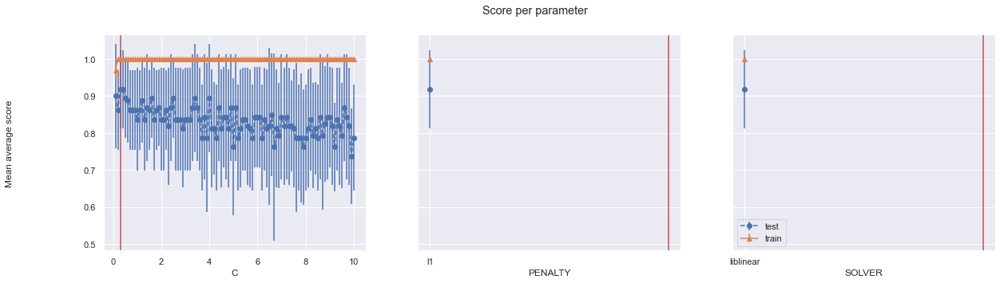

In [261]:

print('The best parameters set for grid search is: {}'.format(gridsearch.best_params_))
def plot_search_results(grid):
    """
    Params: 
        grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_train_score']
    stds_train = results['std_train_score']
    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))

    params=grid.param_grid

    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none', sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'Mean average score', va='center', rotation='vertical')
    pram_preformace_in_best = {}
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        ax[i].axvline(x=0.3,color='r')
        ax[i].set_xlabel(p.upper())
        
    plt.savefig('the resut')
    

    plt.legend()
    plt.show()

plot_search_results(result)

In [181]:

def lasso_beta(lamb,X,Y):
    model = LogisticRegression(penalty='l1',fit_intercept=False,C=lamb,solver='liblinear')
    model.fit(X,Y)
    coeffs=model.coef_
    return coeffs
def ridge_beta(lamb,X,Y):
    model = LogisticRegression(penalty='l2',C=lamb,fit_intercept=False)
    model.fit(X,Y)
    coeffs=model.coef_
    return coeffs

def elastic_beta(X,Y,lam):
    model = LogisticRegression(penalty='elasticnet',solver='saga',C=lam,fit_intercept=False,l1_ratio=0.5)
    model.fit(X,Y)
    coeffs=model.coef_
    return coeffs

In [182]:
orin=[]
lamb=[]
for i in range(1,10001):
    lamb.append(1/(0.01*i))
    orin.append(0.01*i)
kss=[]

for i in range(len(lamb)):
    kss.append(np.absolute(lasso_beta(lamb[i],train_standardized,ytrain)))
print(np.shape(kss))
print(kss[1][0])

(10000, 1, 7129)
[0. 0. 0. ... 0. 0. 0.]


In [183]:
ks=np.array(kss)
ksss=np.transpose(ks)
print(np.shape(ksss))
print(ksss[1])

(7129, 1, 10000)
[[0. 0. 0. ... 0. 0. 0.]]


In [ ]:


new_data=np.vstack((train_standardized,test_standardized))

new_y=np.hstack((np.array(ytrain),np.array(ytest)))

np.savetxt('data.csv',new_data,delimiter=',')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_standardized, ytrain[0:38],
                                                    stratify=ytrain[0:38], 
                                                    test_size=0.1)

In [ ]:
logistic2=LogisticRegression(penalty='none')
ridgec=LogisticRegression(penalty='l2')
lassoC=LogisticRegression(penalty='l1',solver='liblinear')
elastic=LogisticRegression(penalty='elasticnet',solver='saga',l1_ratio=0.99)
accuRidge=[]
accuLogistic=[]
accuLasso=[]
accuElastic=[]
for i in range(2,34):
    alpha=i
    FeatureVariable=pd.DataFrame(X_train).iloc[0:alpha,:]
    TargetVariable=y_train[0:alpha]
    logistic2.fit(FeatureVariable,TargetVariable )
    ridgec.fit(FeatureVariable,TargetVariable)
    lassoC.fit(FeatureVariable,TargetVariable)
    elastic.fit(FeatureVariable,TargetVariable)
    pred1=ridgec.predict(test_standardized)
    pred2=logistic2.predict(test_standardized)
    pred3=lassoC.predict(test_standardized)
    pred4=elastic.predict(test_standardized)
    accuRidge.append(accuracy_score(ytest, pred1))
    accuLogistic.append(accuracy_score(ytest,pred2))
    accuLasso.append(accuracy_score(ytest,pred3))
    accuElastic.append(accuracy_score(ytest,pred4))

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The ma

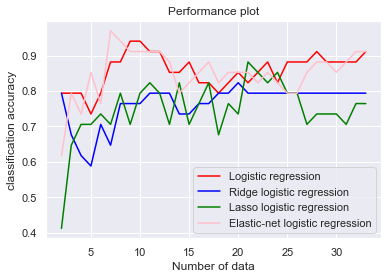

In [ ]:
plt.plot([i for i in range(2,34)], accuLogistic, color='red',label='Logistic regression')
plt.plot([i for i in range(2,34)], accuRidge, color='blue',label='Ridge logistic regression')
plt.plot([i for i in range(2,34)], accuLasso, color='green',label='Lasso logistic regression')
plt.plot([i for i in range(2,34)], accuElastic, color='pink',label='Elastic-net logistic regression')
plt.title('Performance plot')
plt.xlabel('Number of data')
plt.ylabel('classification accuracy')
plt.legend()
#plt.vlines(x=11,colors='black',ymin=0.4,ymax=0.8,linestyles='--')

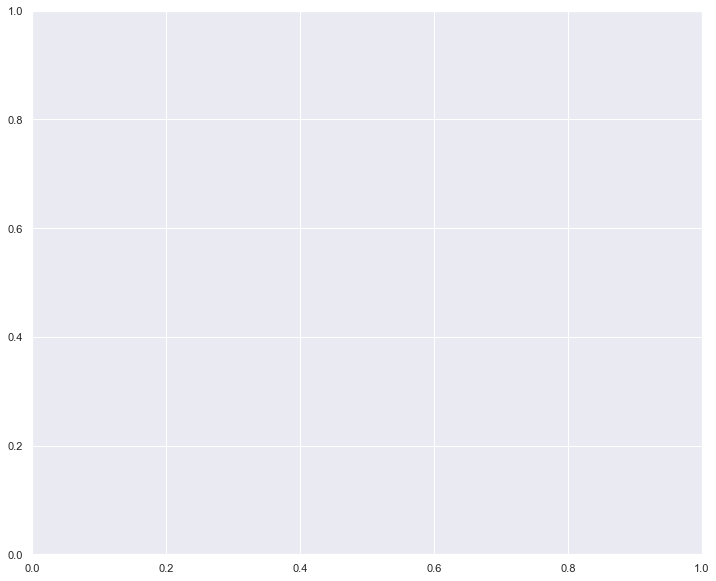

In [ ]:
# manual nested cross-validation for random forest on a classification dataset
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

fig,ax=plt.subplots(figsize=(12,10))#figure and axes object(s) with size (10,10)
from sklearn.model_selection import cross_val_score
c=[i*0.01 for i in range(1,100)]
accuracy=[]
sd=[]
for element in c:
    model=LogisticRegression(penalty='l2',C=element)
    scores = cross_val_score(model, train_standardized, ytrain, cv=10, scoring='accuracy')
    accuracy.append(scores.mean())
    sd.append(np.std(scores)/np.sqrt(len(scores)))



Text(0, 0.5, 'Accuracy')

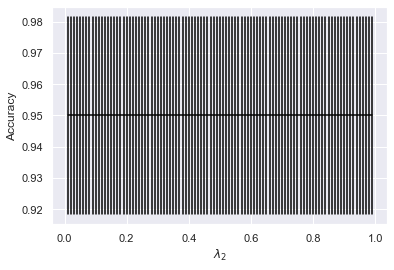

In [ ]:
import matplotlib.pyplot as plt

# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(c, accuracy,color='black')
for i in range(len(sd)):
    plt.plot([c[i],c[i]],[accuracy[i]+sd[i],accuracy[i]-sd[i]],color='black')
plt.xlabel(r'$\lambda_2$')
plt.ylabel('Accuracy')

In [ ]:
train33=train3.iloc[:,1:]
ytrain33=train3.iloc[:,0]
test33=test3.iloc[:,1:]
ytest33=test3.iloc[:,0]
ytrain32=list(ytrain33)
ytrain33=[]
for i in range(len(ytrain32)):
    ytrain33.append(ytrain32[i]-mean(ytrain32))
print(mean(ytrain33))
ytest32=list(ytest33)
ytest33=[]
for i in range(len(ytest32)):
    ytest33.append(ytest32[i]-mean(ytest32))
print(mean(ytest33))
print(ytrain33)
print(ytest33)

-7.47939721852737e-15
3.343730521224001e-15
[-93.13157894736842, -18.131578947368425, 44.868421052631575, -14.131578947368425, 14.868421052631575, -17.131578947368425, 48.868421052631575, -292.13157894736844, 125.86842105263158, 32.868421052631575, -44.131578947368425, 53.868421052631575, 28.868421052631575, 7.868421052631575, 13.868421052631575, 3.868421052631575, -355.13157894736844, 39.868421052631575, 76.86842105263158, 137.86842105263156, -23.131578947368425, -126.13157894736842, 46.868421052631575, 0.8684210526315752, 39.868421052631575, 8.868421052631575, -152.13157894736844, 116.86842105263158, 135.86842105263156, -197.13157894736844, 88.86842105263158, -3.131578947368425, -14.131578947368425, 100.86842105263158, 127.86842105263158, -92.13157894736842, 95.86842105263158, 48.868421052631575]
[-234.44117647058823, 20.558823529411768, 45.55882352941177, 129.55882352941177, 193.55882352941177, -38.44117647058823, -79.44117647058823, 51.55882352941177, -135.44117647058823, -22.44117

In [ ]:
train3.head()

Gene Accession Number,AFFX-BioB-5_at,AFFX-BioB-M_at,AFFX-BioB-3_at,AFFX-BioC-5_at,AFFX-BioC-3_at,AFFX-BioDn-5_at,AFFX-BioDn-3_at,AFFX-CreX-5_at,AFFX-CreX-3_at,AFFX-BioB-5_st,...,U48730_at,U58516_at,U73738_at,X06956_at,X16699_at,X83863_at,Z17240_at,L49218_f_at,M71243_f_at,Z78285_f_at
0,-214.0,-153.0,-58.0,88.0,-295.0,-558.0,199.0,-176.0,252.0,206.0,...,185.0,511.0,-125.0,389.0,-37.0,793.0,329.0,36.0,191.0,-37.0
1,-139.0,-73.0,-1.0,283.0,-264.0,-400.0,-330.0,-168.0,101.0,74.0,...,169.0,837.0,-36.0,442.0,-17.0,782.0,295.0,11.0,76.0,-14.0
2,-76.0,-49.0,-307.0,309.0,-376.0,-650.0,33.0,-367.0,206.0,-215.0,...,315.0,1199.0,33.0,168.0,52.0,1138.0,777.0,41.0,228.0,-41.0
3,-135.0,-114.0,265.0,12.0,-419.0,-585.0,158.0,-253.0,49.0,31.0,...,240.0,835.0,218.0,174.0,-110.0,627.0,170.0,-50.0,126.0,-91.0
4,-106.0,-125.0,-76.0,168.0,-230.0,-284.0,4.0,-122.0,70.0,252.0,...,156.0,649.0,57.0,504.0,-26.0,250.0,314.0,14.0,56.0,-25.0


In [ ]:
scaler = preprocessing.StandardScaler()
# Apply the same scaling to both datasets
train_standardized = scaler.fit_transform(train33)
test_standardized = scaler.transform(test33)

In [ ]:
#linear regression
LinearR=LinearRegression().fit(train_standardized,ytrain33)
Y_pred=LinearR.predict(test_standardized)
LinearError=mean_squared_error(ytest33,Y_pred,squared=True)
error1=np.subtract(ytest33,Y_pred)**2
coeff1=LinearR.coef_
#Ridge
RidgeR=linear_model.Ridge(alpha=600).fit(train_standardized,ytrain33)
Y_predRidge=RidgeR.predict(test_standardized)
RidgeError=mean_squared_error(ytest33,Y_predRidge,squared=True)
error2=np.subtract(ytest33,Y_predRidge)**2
coeff2=RidgeR.coef_
#lasso
LassoR=linear_model.Lasso(alpha=0.21).fit(train_standardized,ytrain33)
Y_predLasso=LassoR.predict(test_standardized)
LassoError=mean_squared_error(ytest33,Y_predLasso,squared=True)
error3=np.subtract(ytest33,Y_predLasso)**2
coeff3=LassoR.coef_
#elastic-net
ElasticR=linear_model.ElasticNet(alpha=0.065,l1_ratio=0.9).fit(train_standardized,ytrain33)
Y_predElastic=ElasticR.predict(test_standardized)
ElasticError=mean_squared_error(ytest33,Y_predElastic,squared=True)
error4=np.subtract(ytest33,Y_predElastic
                   )**2
coeffs4=ElasticR.coef_
fig = px.bar(x=["Linear","Lasso","Ridge","Elastic-net"], 
             y=[LinearError,LassoError,RidgeError,ElasticError],
             title="Mean squared errors",
             labels={"y": "Error","x": "Regression method"})
fig.add_hline(y=min([LinearError,LassoError,RidgeError]))
fig.show()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.776e+02, tolerance: 4.441e+01

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.533e+02, tolerance: 4.441e+01



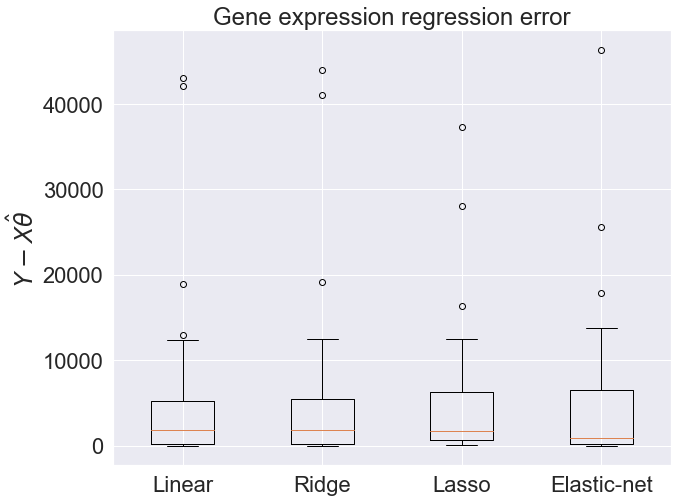

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
data=[error1,error2,error3,error4]
# font size 2
ax.boxplot(data)
plt.title('Gene expression regression error')
plt.ylabel(r'$Y-X\hat{\theta}$')
plt.xticks([1,2,3,4],['Linear','Ridge','Lasso','Elastic-net'])
plt.savefig('123')
sns.set(font_scale=2) 
plt.show()

In [ ]:
print(coeff2)


[ 0.13101544  0.08075251  0.10345926 ... -0.01717191  0.13285305
 -0.05688439]


In [ ]:
data={'Linear':coeff1,'Ridge':coeff2,'Lasso':coeff3,'Elastic-net':coeffs4}
data=pd.DataFrame(data)
data.iloc[935]


Linear        -0.239958
Ridge         -0.209613
Lasso         -4.893764
Elastic-net   -4.149294
Name: 935, dtype: float64

In [ ]:
count=0
for i in range(len(coeff3)):
    if coeff3[i]==0:
        pass
    else:
        print(i)
        count=count+1

773
935
986
990
1581
1693
1695
1696
1759
1817
1947
1955
1982
2011
2081
2098
2236
2456
2466
2505
2594
2683
2759
2805
2876
2943
3076
3138
3228
3322
3336
3419
3599
3651
3758
3780
4190
4534
4615
4626
4627
4887
5082
5250
5351
5379
5458
5490
5518
5730
5745
5758
5947
6037
6076
6146
6274
6677
6703
6996


In [ ]:
print(count)
"lasso 60"
"elastic-net 243 "

7128


'elastic-net 243 '

In [ ]:
ridgec=linear_model.Lasso(alpha=1)
lassoC=linear_model.ElasticNet(alpha=1,l1_ratio=0.9)

error2=np.subtract(ytest33,Y_predRidge)**2
accuRidge=[]
accuLogistic=[]
for i in range(2,71):
    alpha=100*i
    FeatureVariable=train_standardized[:,0:alpha]
    testFeatureVariable=test_standardized[:,0:alpha]
    ridgec.fit(FeatureVariable,ytrain33)
    lassoC.fit(FeatureVariable,ytrain33)
    pred1=ridgec.predict(testFeatureVariable)
    pred2=lassoC.predict(testFeatureVariable)
    accuRidge.append(np.subtract(ytest33,pred1)**2)
    accuLogistic.append(np.subtract(ytest33,pred2)**2)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.075e+02, tolerance: 4.441e+01

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.727e+01, tolerance: 4.441e+01

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

Text(0, 0.5, 'classification accuracy')

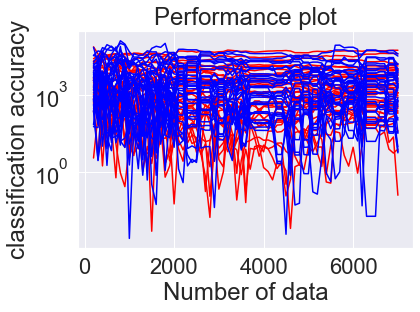

In [ ]:

plt.plot([100*i for i in range(2,71)], accuLogistic, color='red',label='Lasso regression')
plt.plot([100*i for i in range(2,71)], accuRidge, color='blue',label='Elastic-net regression')
plt.title('Performance plot')
plt.xlabel('Number of data')
plt.yscale("log") 
plt.ylabel('classification accuracy')

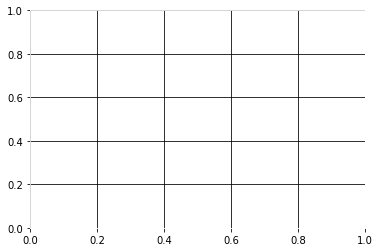

In [ ]:
import matplotlib.pyplot as plt


plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['axes.edgecolor'] = 'white'
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 1
plt.rcParams['grid.color'] = "#cccccc"
plt.rc('grid', linestyle="-", color='black')

plt.grid(True)

plt.show()